In [1]:
import os
import cv2
import numpy as np
from skimage.util import random_noise
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import Sequence

import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.util import random_noise
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import Sequence
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D
from tensorflow.keras.models import Model
import math
from skimage.metrics import peak_signal_noise_ratio as compare_psnr
from skimage.metrics import structural_similarity as compare_ssim
from tensorflow.keras.metrics import MeanAbsoluteError
from keras.layers import BatchNormalization, Activation, Dropout, concatenate

from tensorflow.keras.layers import LeakyReLU, Add, Dense, Flatten, Conv2DTranspose, ZeroPadding2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Model, Sequential
import tensorflow as tf


from tensorflow.keras.layers import Input, Dense, Reshape, Flatten, Conv2D, Conv2DTranspose, LeakyReLU, Dropout, BatchNormalization
from tensorflow.keras.models import Sequential, Model
from keras.callbacks import ModelCheckpoint
from keras.models import load_model

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Function to add noise

In [5]:
# Function to add various types of noise to an image
def add_various_noises(image):
    noise_types = ['gaussian', 's&p', 'speckle', 'poisson']
    noisy_images = [random_noise(image, mode=noise_type) for noise_type in noise_types]
    return noisy_images

## Image Generaration

In [2]:
# Data Generator Class
class ImageDataGenerator(Sequence):
    def __init__(self, image_paths, batch_size, augment_function):
        self.image_paths = image_paths
        self.batch_size = batch_size
        self.augment_function = augment_function

    def __len__(self):
        # Adjusting length to account for the increased dataset size with noise variations + original images
        return math.ceil((len(self.image_paths) * (len(noise_types) + 1)) / self.batch_size)

    def __getitem__(self, idx):
        start = (idx * self.batch_size) // (len(noise_types) + 1)
        end = ((idx + 1) * self.batch_size) // (len(noise_types) + 1)
        batch_paths = self.image_paths[start:end]
        batch_x = []
        batch_y = []

        for path in batch_paths:
            image = cv2.imread(path)
            if image is not None:
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB
                image = image.astype('float32') / 255.
                augmented_images = self.augment_function(image)
                augmented_images.append(image)  # To include the original image

                for aug_image in augmented_images:
                    aug_image = np.array(aug_image).astype('float32')  # Ensure correct data type
                    batch_x.append(aug_image)
                    batch_y.append(image)

                # Ensure the batch is not exceeding the specified size
                if len(batch_x) >= self.batch_size:
                    break

        # Make sure the batch size is exactly what was requested 
        batch_x = batch_x[:self.batch_size]
        batch_y = batch_y[:self.batch_size]

        return np.array(batch_x), np.array(batch_y)


### Splitting Data for Training, Testing and Validation

In [3]:

# Assuming noise_types is defined globally as in the add_various_noises function
noise_types = ['gaussian', 's&p', 'speckle', 'poisson']

# Paths loading and splitting code remains unchanged
folder = "/content/drive/My Drive/content/content/Diabetic_Balanced_Data/train/0/"
image_paths = [os.path.join(folder, filename) for filename in os.listdir(folder)]  # Ensure only image files are included

train_paths, test_paths = train_test_split(image_paths, test_size=0.2, random_state=42)
train_paths, val_paths = train_test_split(train_paths, test_size=0.25, random_state=42)


In [6]:
batch_size = 16

# Generator initialization remains unchanged
train_generator = ImageDataGenerator(train_paths, batch_size, add_various_noises)
val_generator = ImageDataGenerator(val_paths, batch_size, add_various_noises)
test_generator = ImageDataGenerator(test_paths, batch_size, add_various_noises)

In [ ]:
# Use one image to get the dimensions
sample_image = cv2.imread(train_paths[0])
image_height, image_width, channels = sample_image.shape
sample_image.shape

(512, 512, 3)

## Building GANs

In [7]:
def build_generator():
    input_img = Input(shape=(512, 512, 3))

    # Encoder
    x = Conv2D(32, (3, 3), activation='relu', padding='same')(input_img)
    x = MaxPooling2D((2, 2), padding='same')(x)
    x = Dropout(0.2)(x)  # Regularization
    x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
    x = MaxPooling2D((2, 2), padding='same')(x)

    x = Conv2D(64, (3, 3), activation='relu', padding='same')(input_img)
    x = MaxPooling2D((2, 2), padding='same')(x)
    x = Dropout(0.2)(x)  # Regularization
    x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = MaxPooling2D((2, 2), padding='same')(x)

    x = Conv2D(128, (3, 3), activation='relu', padding='same')(input_img)
    x = MaxPooling2D((2, 2), padding='same')(x)
    x = Dropout(0.2)(x)  # Regularization
    x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = MaxPooling2D((2, 2), padding='same')(x)

    # Bottleneck
    encoded = Conv2D(256, (3, 3), activation='relu', padding='same')(x)

    # Decoder
    x = Conv2D(128, (3, 3), activation='relu', padding='same')(encoded)
    x = UpSampling2D((2, 2))(x)
    x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = UpSampling2D((2, 2))(x)

    x = Conv2D(64, (3, 3), activation='relu', padding='same')(encoded)
    x = UpSampling2D((2, 2))(x)
    x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = UpSampling2D((2, 2))(x)

    x = Conv2D(32, (3, 3), activation='relu', padding='same')(encoded)
    x = UpSampling2D((2, 2))(x)
    x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
    x = UpSampling2D((2, 2))(x)

    outputs = Conv2D(3, (3, 3), activation='sigmoid', padding='same')(x)
    model = Model(input_img, outputs, name="generator")

    return model



In [8]:
def build_discriminator():
    model = Sequential()
    model.add(Conv2D(64, kernel_size=3, strides=2, input_shape=(512, 512, 3), padding="same"))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.25))
    
    model.add(Conv2D(128, kernel_size=3, strides=2, padding="same"))
    model.add(ZeroPadding2D(padding=((0,1),(0,1))))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.25))
    
    model.add(Conv2D(256, kernel_size=3, strides=2, padding="same"))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.25))
    
    model.add(Conv2D(512, kernel_size=3, strides=2, padding="same"))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.25))
    model.add(Flatten())
    model.add(Dense(1, activation='sigmoid'))
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model


In [9]:
def train_gan(generator, discriminator, gan, train_generator, epochs, batch_size):
    valid = np.ones((batch_size, 1))
    fake = np.zeros((batch_size, 1))

    # Checkpoint paths
    checkpoint_path_g = '/content/drive/MyDrive/Colab Notebooks/generator_epoch_{epoch:03d}.h5'
    checkpoint_path_d = '/content/drive/MyDrive/Colab Notebooks/discriminator_epoch_{epoch:03d}.h5'

    # Checkpoint callbacks
    checkpoint_g = ModelCheckpoint(checkpoint_path_g, save_freq='epoch', verbose=1)
    checkpoint_d = ModelCheckpoint(checkpoint_path_d, save_freq='epoch', verbose=1)

    for epoch in range(epochs):
        for _ in range(len(train_generator)):
            imgs, _ = train_generator.__getitem__(np.random.randint(0, len(train_generator)))
            noise_imgs = imgs[np.random.choice(imgs.shape[0], batch_size, replace=True), :, :, :]

            # Generate a batch of new images
            gen_imgs = generator.predict(noise_imgs)

            # Train the discriminator
            d_loss_real = discriminator.train_on_batch(noise_imgs, valid)
            d_loss_fake = discriminator.train_on_batch(gen_imgs, fake)
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

            # Train the generator
            g_loss = gan.train_on_batch(noise_imgs, valid)

            print(f"Epoch: {epoch + 1}/{epochs} | D Loss: {d_loss[0]}, acc.: {100*d_loss[1]}% | G Loss: {g_loss}")

        # Save models at the end of each epoch with callbacks
        checkpoint_g.model = generator
        checkpoint_g.on_epoch_end(epoch, logs={'loss': g_loss})

        checkpoint_d.model = discriminator
        checkpoint_d.on_epoch_end(epoch, logs={'loss': d_loss[0], 'acc': 100*d_loss[1]})


In [10]:
def compile_gan(generator, discriminator):
    # Compile discriminator
    discriminator.compile(loss='binary_crossentropy', optimizer=tf.keras.optimizers.legacy.Adam(0.0002, 0.5), metrics=['accuracy'])

    # Make discriminator non-trainable when we are training the generator
    discriminator.trainable = False

    # Compile combined model
    gan_input = Input(shape=(512, 512, 3))
    gan_output = discriminator(generator(gan_input))
    gan = Model(gan_input, gan_output)
    gan.compile(loss='binary_crossentropy', optimizer=tf.keras.optimizers.legacy.Adam(0.0002, 0.5))

    return gan

# Generator and discriminator have been initialized
generator = build_generator()
discriminator = build_discriminator()
gan = compile_gan(generator, discriminator)

2024-04-18 12:06:09.303919: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M1 Pro
2024-04-18 12:06:09.303953: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 16.00 GB
2024-04-18 12:06:09.303961: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 5.33 GB
2024-04-18 12:06:09.303999: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:303] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2024-04-18 12:06:09.304018: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:269] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


## Model Training

In [ ]:
# Training parameters
epochs = 10  
batch_size = 16  


In [ ]:
# Start training
train_gan(generator, discriminator, gan, train_generator, epochs, batch_size)

1/1 [==============================] - 4s 4s/step
Epoch: 1/10 | D Loss: 7.524031609296799, acc.: 9.375% | G Loss: 0.47663629055023193
1/1 [==============================] - 0s 68ms/step
Epoch: 1/10 | D Loss: 0.7734799766913056, acc.: 50.0% | G Loss: 0.9134197235107422
1/1 [==============================] - 0s 63ms/step
Epoch: 1/10 | D Loss: 1.1077184155583382, acc.: 50.0% | G Loss: 0.8047038316726685
1/1 [==============================] - 0s 61ms/step
Epoch: 1/10 | D Loss: 1.0169349312782288, acc.: 46.875% | G Loss: 0.7294249534606934
1/1 [==============================] - 0s 61ms/step


KeyboardInterrupt: 

In [ ]:
# Manually loading the models from checkpoints
generator_checkpoint_path = '/content/drive/MyDrive/Colab Notebooks/generator_model.h5'
discriminator_checkpoint_path = '/content/drive/MyDrive/Colab Notebooks/discriminator_model.h5'

generator = load_model(generator_checkpoint_path)
discriminator = load_model(discriminator_checkpoint_path)
gan = compile_gan(generator, discriminator)

In [ ]:
def train_gan(generator, discriminator, gan, train_generator, epochs, batch_size, start_epoch=0):
    valid = np.ones((batch_size, 1))
    fake = np.zeros((batch_size, 1))

    for epoch in range(start_epoch, epochs):
        for _ in range(len(train_generator)):
            imgs, _ = train_generator.__getitem__(np.random.randint(0, len(train_generator)))
            noise_imgs = imgs[np.random.choice(imgs.shape[0], batch_size, replace=True), :, :, :]

            # Generate a batch of new images
            gen_imgs = generator.predict(noise_imgs)

            # Train the discriminator
            d_loss_real = discriminator.train_on_batch(noise_imgs, valid)
            d_loss_fake = discriminator.train_on_batch(gen_imgs, fake)
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

            # Train the generator
            g_loss = gan.train_on_batch(noise_imgs, valid)

            print(f"Epoch: {epoch + 1}/{epochs} | D Loss: {d_loss[0]}, acc.: {100*d_loss[1]}% | G Loss: {g_loss}")



In [ ]:
# Start training from epoch 5 (since the last checkpoint was after epoch 4)
train_gan(generator, discriminator, gan, train_generator, epochs, batch_size, start_epoch=4)

Streaming output truncated to the last 5000 lines.
1/1 [==============================] - 0s 67ms/step
Epoch: 8/10 | D Loss: 0.0, acc.: 100.0% | G Loss: 5519.3037109375
1/1 [==============================] - 0s 66ms/step
Epoch: 8/10 | D Loss: 0.0, acc.: 100.0% | G Loss: 5537.39794921875
1/1 [==============================] - 0s 67ms/step
Epoch: 8/10 | D Loss: 0.0, acc.: 100.0% | G Loss: 5512.6298828125
1/1 [==============================] - 0s 69ms/step
Epoch: 8/10 | D Loss: 0.0, acc.: 100.0% | G Loss: 5494.61328125
1/1 [==============================] - 0s 69ms/step
Epoch: 8/10 | D Loss: 0.0, acc.: 100.0% | G Loss: 5527.4873046875
1/1 [==============================] - 0s 72ms/step
Epoch: 8/10 | D Loss: 0.0, acc.: 100.0% | G Loss: 5503.97607421875
1/1 [==============================] - 0s 69ms/step
Epoch: 8/10 | D Loss: 0.0, acc.: 100.0% | G Loss: 5509.7265625
1/1 [==============================] - 0s 68ms/step
Epoch: 8/10 | D Loss: 0.0, acc.: 100.0% | G Loss: 5490.2685546875
1/1 [===

KeyboardInterrupt: 

In [ ]:
# Start training from epoch 9 (since the last checkpoint was after epoch 4)
train_gan(generator, discriminator, gan, train_generator, epochs, batch_size, start_epoch=9)

Streaming output truncated to the last 5000 lines.
1/1 [==============================] - 0s 64ms/step
Epoch: 10/10 | D Loss: 0.0, acc.: 100.0% | G Loss: 3672.760986328125
1/1 [==============================] - 0s 61ms/step
Epoch: 10/10 | D Loss: 0.0, acc.: 100.0% | G Loss: 3732.28662109375
1/1 [==============================] - 0s 62ms/step
Epoch: 10/10 | D Loss: 0.0, acc.: 100.0% | G Loss: 3703.5810546875
1/1 [==============================] - 0s 63ms/step
Epoch: 10/10 | D Loss: 0.0, acc.: 100.0% | G Loss: 3596.76953125
1/1 [==============================] - 0s 63ms/step
Epoch: 10/10 | D Loss: 0.0, acc.: 100.0% | G Loss: 3582.0595703125
1/1 [==============================] - 0s 61ms/step
Epoch: 10/10 | D Loss: 0.0, acc.: 100.0% | G Loss: 3769.65234375
1/1 [==============================] - 0s 62ms/step
Epoch: 10/10 | D Loss: 0.0, acc.: 100.0% | G Loss: 3764.02197265625
1/1 [==============================] - 0s 61ms/step
Epoch: 10/10 | D Loss: 0.0, acc.: 100.0% | G Loss: 3826.09326171

In [ ]:
generator.save('/content/drive/MyDrive/Colab Notebooks/final_generator_model.keras')
discriminator.save('/content/drive/MyDrive/Colab Notebooks/final_discriminator_model.keras')
gan.save('/content/drive/MyDrive/Colab Notebooks/final_gan_model.keras')

In [12]:
from tensorflow.keras.models import load_model

In [13]:
# Load the model
GAN = load_model('/content/drive/MyDrive/Colab Notebooks/final_gan_model.keras')
generator = load_model('/content/drive/MyDrive/Colab Notebooks/final_generator_model.keras')
discriminator = load_model('/content/drive/MyDrive/Colab Notebooks/final_discriminator_model.keras')

## Model Evaluavation

In [22]:
import numpy as np
from skimage.metrics import peak_signal_noise_ratio, mean_squared_error
import sewar
import cv2
from piq import fsim
import torch
from concurrent.futures import ThreadPoolExecutor, as_completed

In [23]:
def tf_ssim(original, denoised):
    # Convert images to float32 tensors
    original_tf = tf.convert_to_tensor(original, dtype=tf.float32)
    denoised_tf = tf.convert_to_tensor(denoised, dtype=tf.float32)

    # Calculate SSIM over the full image, must be in range [0, 255]
    ssim = tf.image.ssim(original_tf, denoised_tf, max_val=255, filter_size=11)
    return ssim.numpy()  # Convert the result back to numpy

In [24]:
def get_fsim(original, denoised):
    original_tensor = torch.tensor(original).permute(2, 0, 1).unsqueeze(0).float() / 255
    denoised_tensor = torch.tensor(denoised).permute(2, 0, 1).unsqueeze(0).float() / 255
    fsim_value = fsim(original_tensor, denoised_tensor)
    return fsim_value

In [25]:
def evaluate_model(generator, model):
    psnrs, ssims, mses, fsims = [], [], [], []
    for i in range(10):
        batch_x, batch_y = generator[i]
        predicted = model.predict(batch_x)

        for j in range(len(batch_x)):
            original = np.clip(batch_y[j] * 255.0, 0, 255).astype("uint8")
            denoised = np.clip(predicted[j] * 255.0, 0, 255).astype("uint8")

            psnr = peak_signal_noise_ratio(original, denoised, data_range=255)
            ssim = tf_ssim(original, denoised)  # Using TensorFlow's SSIM
            mse = mean_squared_error(original, denoised)
            fsim_value = get_fsim(original, denoised)


            psnrs.append(psnr)
            ssims.append(ssim)
            mses.append(mse)
            fsims.append(fsim_value.item())

    avg_psnr = np.mean(psnrs)
    avg_ssim = np.mean(ssims)
    avg_mse = np.mean(mses)
    avg_fsim = np.mean(fsims)

    return avg_psnr, avg_ssim, avg_mse, avg_fsim



In [ ]:
avg_psnr, avg_ssim, avg_mse, avg_fsim = evaluate_model(test_generator, generator)

1/1 [==============================] - 4s 4s/step


In [ ]:
print("Average PSNR:", avg_psnr)
print("Average SSIM:", avg_ssim)
print("Average MSE:", avg_mse)
print("Average FSIM:", avg_fsim)

Average PSNR: 5.44136950548608
Average SSIM: 0.06824662
Average MSE: 18662.04396566592
Average FSIM: 0.428315277358419


## Visualizing Neural Network Layer Activations

In [26]:
import matplotlib.pyplot as plt

In [31]:
from tensorflow.keras.models import Model

In [32]:
def get_activations(model, model_input, layer_names):
    # This function creates a sub-model that will output the activations of the specified layers
    outputs = [model.get_layer(name).output for name in layer_names]
    activation_model = Model(inputs=model.input, outputs=outputs)
    activations = activation_model.predict(model_input)
    return activations

In [33]:
def plot_activations(activations, layer_names):
    # Plot the activations of each layer
    for layer_activations, layer_name in zip(activations, layer_names):
        num_filters = layer_activations.shape[-1]
        size = layer_activations.shape[1]
        n_cols = num_filters // 16  # We will display 16 filters per row
        display_grid = np.zeros((size * n_cols, 16 * size))

        for col in range(n_cols):
            for row in range(16):
                filter_img = layer_activations[0, :, :, col * 16 + row]
                # Post-process the feature to make it visually palatable
                filter_img -= filter_img.mean()
                filter_img /= filter_img.std()
                filter_img *= 64
                filter_img += 128
                filter_img = np.clip(filter_img, 0, 255).astype('uint8')
                display_grid[col * size : (col + 1) * size,
                             row * size : (row + 1) * size] = filter_img

        scale = 1. / size
        plt.figure(figsize=(scale * display_grid.shape[1],
                            scale * display_grid.shape[0]))
        plt.title(layer_name)
        plt.grid(False)
        plt.imshow(display_grid, aspect='auto', cmap='viridis')


In [34]:
# Selecting an image
test_images, _ = next(iter(test_generator))  # Get a batch and take the first image
selected_image = test_images[0:1]  # We slice to keep batch dimension

In [37]:
# Specify layers to visualize
layer_names = ['input_3', 'conv2d_22', 'max_pooling2d_10', 'dropout_9', 'conv2d_23', 'max_pooling2d_11', 'conv2d_24', 'conv2d_29', 'up_sampling2d_10', 'conv2d_30', 'up_sampling2d_11', 'conv2d_31']

1/1 [==============================] - 0s 405ms/step


<ipython-input-33-f96e9ac70e76>:26: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  plt.imshow(display_grid, aspect='auto', cmap='viridis')
<ipython-input-33-f96e9ac70e76>:14: RuntimeWarning: invalid value encountered in divide
  filter_img /= filter_img.std()
<ipython-input-33-f96e9ac70e76>:17: RuntimeWarning: invalid value encountered in cast
  filter_img = np.clip(filter_img, 0, 255).astype('uint8')
/usr/local/lib/python3.10/dist-packages/matplotlib/_tight_bbox.py:64: RuntimeWarning: divide by zero encountered in scalar divide
  fig.patch.set_bounds(x0 / w1, y0 / h1,
/usr/local/lib/python3.10/dist-packages/matplotlib/_tight_bbox.py:65: RuntimeWarning: divide by zero encountered in scalar divide
  fig.bbox.width / w1, fig.bbox.height / h1)
/usr/local/lib/python3.10/dist-packages/matplotlib/patches.py:739: RuntimeWarning: invalid value encountered in scalar add
  y1 = self.convert_yunits(self._y0 + self._height)
/us

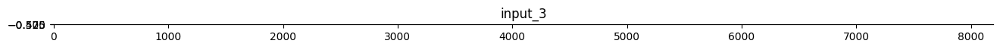

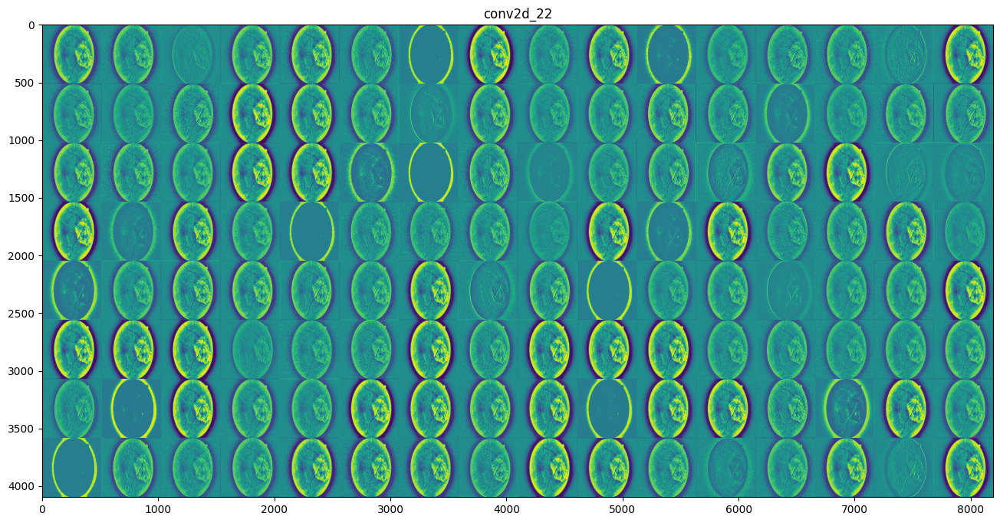

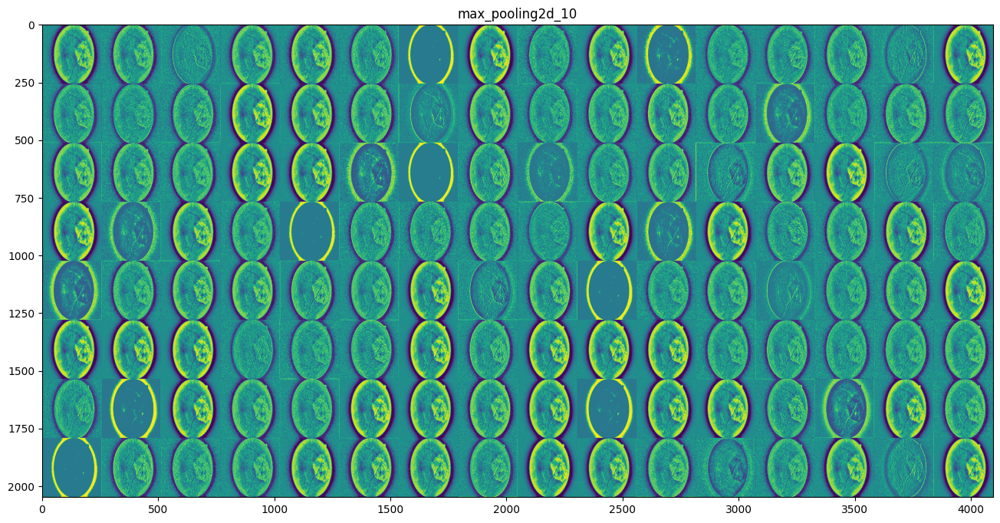

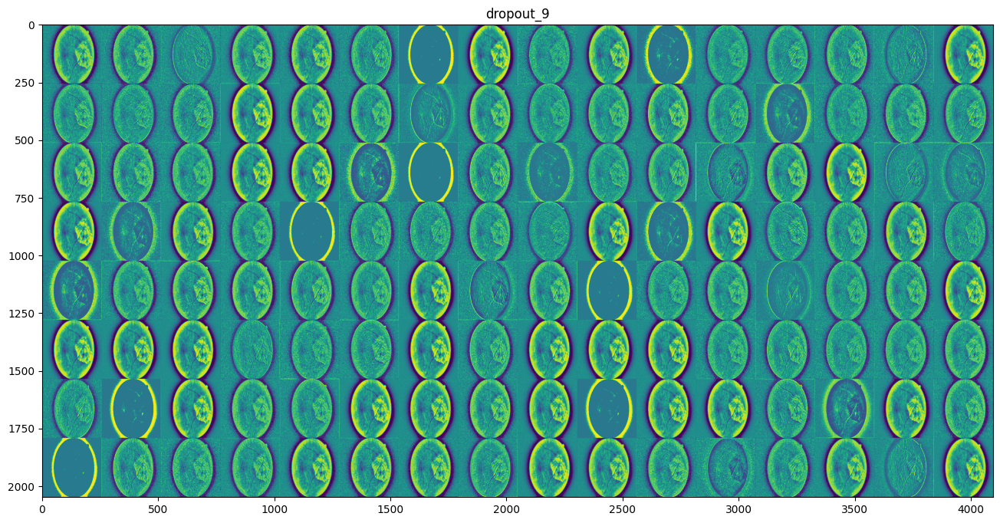

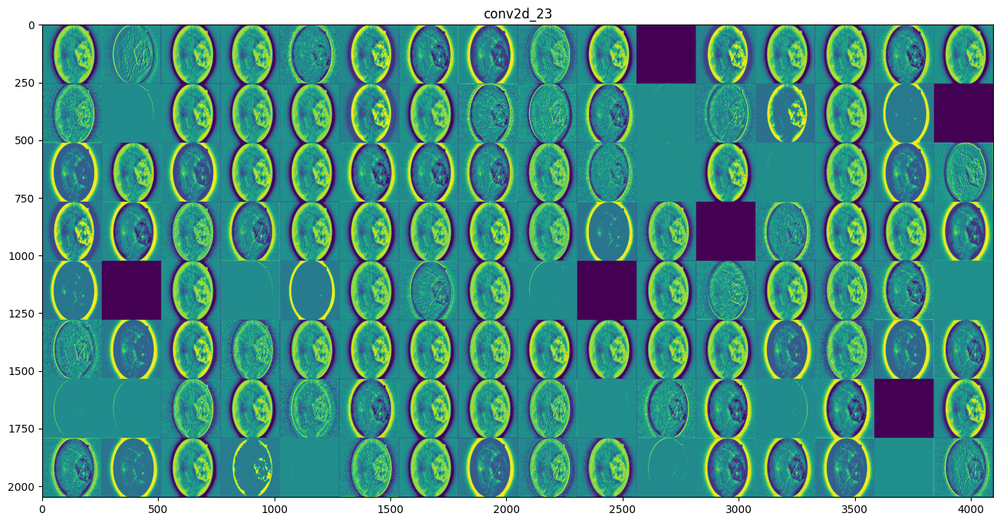

...

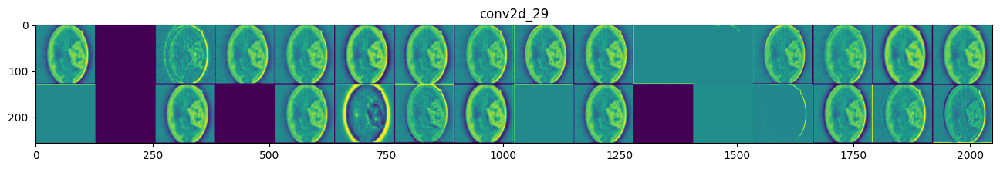

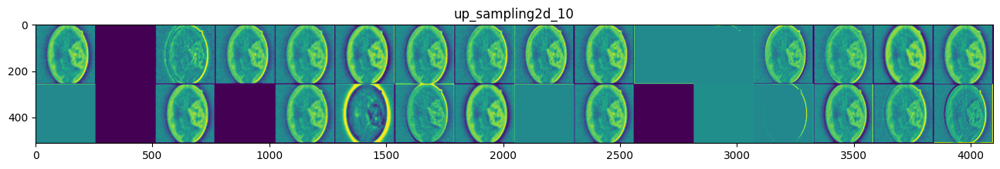

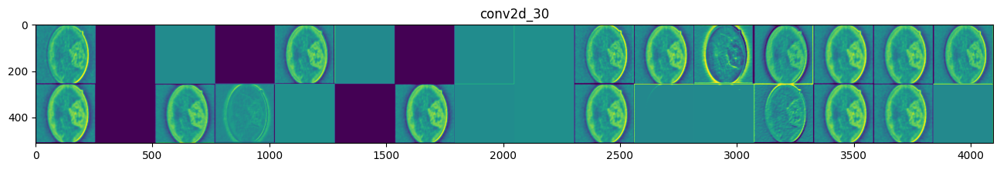

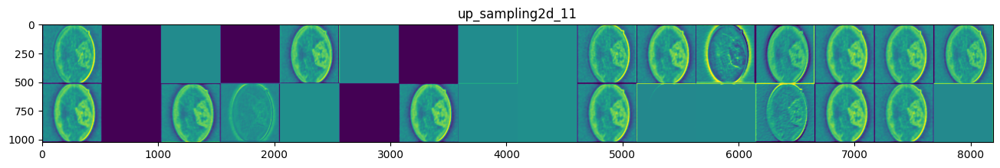

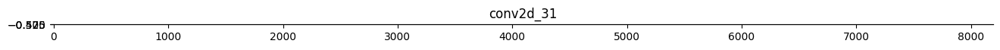

In [38]:
# Get activations and plot
activations = get_activations(generator, selected_image, layer_names)
plot_activations(activations, layer_names)

## Model Architecture Visualization 

In [11]:
from tensorflow.keras.utils import plot_model

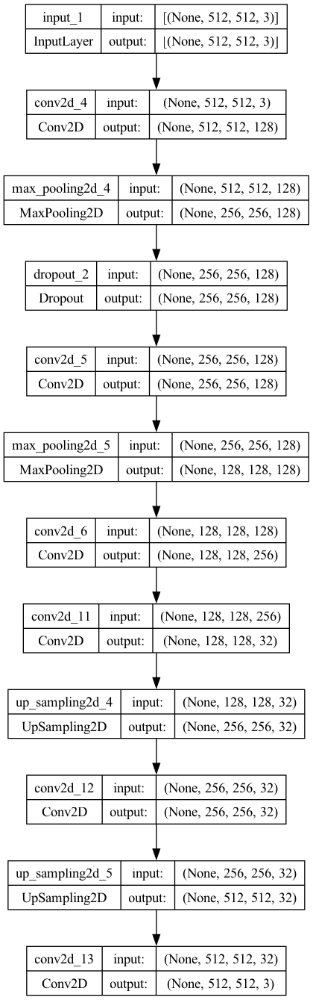

In [13]:
# Plotting model Architecture
plot_model(generator, to_file='GAN_structure.png', show_shapes=True, show_layer_names=True)


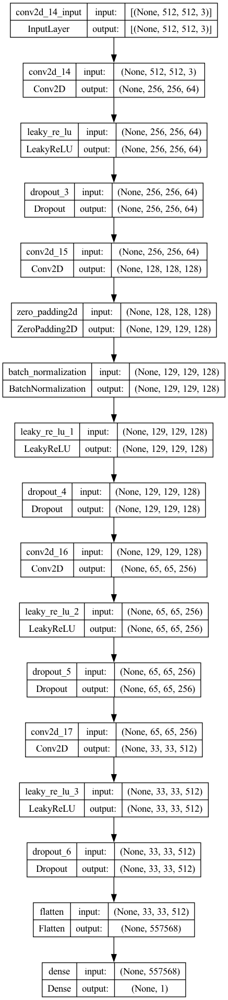

In [14]:
# Plotting model Architecture
plot_model(discriminator, to_file='GAN_structure.png', show_shapes=True, show_layer_names=True)


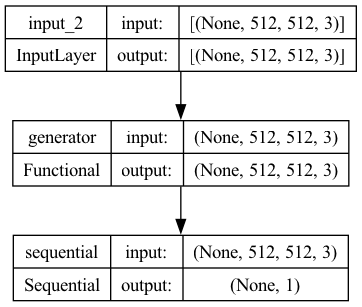

In [15]:
# Plotting model Architecture
plot_model(gan, to_file='GAN_structure.png', show_shapes=True, show_layer_names=True)
